In [1]:
!python --version

Python 3.9.4


In [2]:
# Only run this if you are in google colab

# %%bash
# git clone https://github.com/fengqingthu/CLIP_Steering.git
# git clone https://github.com/openai/CLIP.git

In [3]:
# # Only run this if you are in google colab
# %%bash

# pip install ninja 2>> install.log
# git clone https://github.com/SIDN-IAP/global-model-repr.git tutorial_code 2>> install.log

In [4]:
# Only run this if you are in google colab
# %%bash
# pip install torch==1.9.1+cu111 torchvision==0.10.1+cu111 torchaudio==0.9.1 -f https://download.pytorch.org/whl/torch_stable.html
# pip install \
#   pytorch-pretrained-biggan \
#   ftfy \
#   regex \
#   tqdm \
#   git+https://github.com/openai/CLIP.git \
#   click \
#   requests \
#   pyspng \
#   ninja \
#   imageio-ffmpeg==0.4.3 \
#   scipy

In [5]:
# import google.colab
import sys, torch

sys.path.append('tutorial_code')
if not torch.cuda.is_available():
    print("Change runtime type to include a GPU.")  

## Import all dependencies

Make sure to add CLIP_steering into the path so that we can use the GANAlyze tools.

In [6]:
import logging
import os
import pathlib

import clip
import IPython.display
import numpy as np
import torch.nn.functional as F
import torchvision
import torch.hub
from netdissect import proggan
from PIL import Image
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader

sys.path.insert(0, "./CLIP_Steering")
try:
    import ganalyze_common_utils as common
    import ganalyze_transformations as transformations
except ImportError:
    print("Could not import ganalyze_common_utils or ganalyze_transformations")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Running pytorch', torch.__version__, 'using', device.type)

logging.basicConfig(
    format="%(asctime)s %(levelname)-8s %(message)s",
    level=logging.INFO,
    datefmt="%Y-%m-%d %H:%M:%S",
)

logger = logging.getLogger(__name__)

Running pytorch 1.9.1+cu111 using cuda


# Import and test the Pro GAN model

The GAN generator is just a function z->x that transforms random z to realistic images x.

To generate images, all we need is a source of random z.  Let's make a micro dataset with a few random z.

In [7]:
import torchvision
import torch.hub
from netdissect import nethook, proggan

#n = 'proggan_bedroom-d8a89ff1.pth'
# n = 'proggan_churchoutdoor-7e701dd5.pth'
# n = 'proggan_conferenceroom-21e85882.pth'
# n = 'proggan_diningroom-3aa0ab80.pth'
# n = 'proggan_kitchen-67f1e16c.pth'
n = 'proggan_livingroom-5ef336dd.pth'
# n = 'proggan_restaurant-b8578299.pth'

url = 'http://gandissect.csail.mit.edu/models/' + n
try:
    sd = torch.hub.load_state_dict_from_url(url) # pytorch 1.1
except:
    sd = torch.hub.model_zoo.load_url(url) # pytorch 1.0
proggan_model = proggan.from_state_dict(sd).to(device)
proggan_model

ProgressiveGenerator(
  (layer1): NormConvBlock(
    (norm): PixelNormLayer()
    (conv): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=(3, 3), bias=False)
    (wscale): WScaleLayer()
    (relu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer2): NormConvBlock(
    (norm): PixelNormLayer()
    (conv): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (wscale): WScaleLayer()
    (relu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer3): NormUpscaleConvBlock(
    (norm): PixelNormLayer()
    (up): DoubleResolutionLayer()
    (conv): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (wscale): WScaleLayer()
    (relu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer4): NormConvBlock(
    (norm): PixelNormLayer()
    (conv): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (wscale): WScaleLayer()
    (relu): LeakyReLU(negative_slope=0.2, inplace=Tru

In [12]:
from netdissect import zdataset,renormalize

SAMPLE_SIZE = 20 # Increase this for better results (but slower to run)
zds = zdataset.z_dataset_for_model(proggan_model, size=SAMPLE_SIZE, seed=5555)
len(zds), zds[0][0].shape


(20, torch.Size([512, 1, 1]))

# Import and test CLIP model

Check that the CLIP model works fine. We import CLIP by installing it through PIP. We cloned CLIP's repo to get the CLIP/CLIP.png test image.

In [10]:
clip_model, preprocess = clip.load("ViT-B/32", device=device)
clip_model.eval()
clip_model.to(device)

image = preprocess(Image.open("CLIP/CLIP.png")).unsqueeze(0).to(device)
text = clip.tokenize(["a livingroom", "a bedroom", "a church"]).to(device)

with torch.no_grad():
    image_features = clip_model.encode_image(image)
    text_features = clip_model.encode_text(text)

    logits_per_image, logits_per_text = clip_model(image, text)
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()

print("Label probs:", probs) 

Label probs: [[0.5835   0.4011   0.015076]]


In [13]:
torch.cuda.empty_cache()
latent_space_dim = zds[0][0][:,0,0].shape[0]
context_length = clip_model.context_length
vocab_size = clip_model.vocab_size

print(
    "Model parameters:",
    f"{np.sum([int(np.prod(p.shape)) for p in clip_model.parameters()]):,}",
)
print("Context length:", context_length)
print("Vocab size:", vocab_size)
print("Latent space dimension:", latent_space_dim)

Model parameters: 151,277,313
Context length: 77
Vocab size: 49408
Latent space dimension: 512


In [558]:
#@title Helper functions
from typing import List, Optional, Tuple
from PIL import Image


def show_images(
        images: list[Image.Image],
        resize: Optional[Tuple[int, int]] = None
    ):
    """Show a list of images in a row."""
    images = [np.array(img) for img in images]
    images = np.concatenate(images, axis=1)
    images = Image.fromarray(images)

    if resize:
        images.thumbnail(resize)

    IPython.display.display(images)


def show_and_save_images(
    images: list[Image.Image], batch: int, path: str, variant: str = "original"
):
    show_images(images)

    if not os.path.exists(path):
        os.makedirs(path)

    for i, img in enumerate(images):
        img.save(f"{path}/image_{batch}_{i}_{variant}.png")


def show_gan_results(gan_results: List[List[Tuple[Image.Image, np.ndarray]]]):
    for batch_results in gan_results:
        batch_size = len(batch_results[0][0])
      
        for i in range(batch_size):
            steering_images = [res[0][i] for res in batch_results]
            steering_scores = np.stack(
                [res[1][i].detach().cpu().numpy() for res in batch_results]
            ).tolist()
            print(steering_scores)
            show_images(steering_images, resize=(1024, 256))

def get_clip_probs(image_inputs, text_features, model, attribute_index=0):
    image_inputs = torch.stack([preprocess(img.resize((512, 512))) for img in image_inputs]).to(device)
    image_features = model.encode_image(image_inputs).float()

    # normalized features
    image_features = image_features / image_features.norm(dim=1, keepdim=True)
    text_features = text_features / text_features.norm(dim=1, keepdim=True)

    # cosine similarity as logits
    logit_scale = model.logit_scale.exp()
    logits_per_image = logit_scale * image_features @ text_features.t()

    clip_probs = logits_per_image.softmax(dim=-1)

    return clip_probs.narrow(dim=-1, start=attribute_index, length=1).squeeze(dim=-1)

def show_gan_results(gan_results: list):
    for batch_results in gan_results:
        batch_size = len(batch_results[0][0])
      
        for i in range(batch_size):
            steering_images = [res[0][i] for res in batch_results]
            steering_scores = np.stack(
                [res[1][i].detach().cpu().numpy() for res in batch_results]
            ).tolist()
            print(steering_scores)
            show_images(steering_images, resize=(1024, 256))


def make_images_and_probs(
    model, zdataset, clip_model, encoded_text, attribute_index=0
):
    gan_images = []
    for z in zdataset:
      gan_output = model(z[None,...])[0]      
      gan_images.append(renormalize.as_image(gan_output))
      
    clip_probs = get_clip_probs(gan_images, encoded_text, clip_model, attribute_index)

    return gan_images, clip_probs

## Use CLIP to extract target text attributes

Use the CLIP model to extract target text attributes for steering the output of a GAN. We use the CLIP tokenizer and encoder to extract text features and normalize them.

The resulting text features are used later to steer the GAN output towards the desired attribute.

In [560]:
# Extract text features for clip

# Here is how we specify the desired attributes
attributes = ["a metallic livingroom", "a scientific livingroom"]
attribute_index = 0  # which attribute do we want to maximize
text_descriptions = [f"{label}" for label in attributes]


with torch.no_grad():
    text_tokens = clip.tokenize(text_descriptions).to(device)
    text_features = clip_model.encode_text(text_tokens).float()
    # text_features = F.normalize(text_features, p=2, dim=-1)

text_features.shape

torch.Size([2, 512])

# Declare the GAN streering model

This is the model in charge of changing the vectors `z` so that it aligns with the objective declared in `text_features`.

In [561]:
transformation = transformations.OneDirection(latent_space_dim, vocab_size)
transformation = transformation.to(device)


approach:  one_direction



In [562]:
checkpoint_dir = f"checkpoints/results_maximize_classifier_probability"
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_name = f"pytorch_model_progran_steering_{attributes[attribute_index]}_final.pth"
print (checkpoint_dir)
print (checkpoint_name)


checkpoints/results_maximize_classifier_probability
pytorch_model_progran_steering_a metallic livingroom_final.pth


# Traning steps

Now we're ready to train the GAN steering model called `transformation`. The overall algorithm looks like this:

1. Generate the noise and class vectors for a given number of training samples.
2. For each batch, generate the GAN images and calculate the CLIP scores comparing the images features correlation with the target text features.
3. Use the `transformation` model to adjust the original noise. Repeat step 2 for the transformed noise `z_transformed`.
4. Compare the scoring output, and make the model optimize to minimize the difference between the target scores and the resulting one after transforming the original noise.



In [563]:
optimizer = torch.optim.Adam(
    transformation.parameters(), lr=0.0002
)  # as specified in GANalyze
losses = common.AverageMeter(name="Loss")

#  training settings
optim_iter = 0
batch_size = 64  # Do not change
train_alpha_a = -0.5  # Lower limit for step sizes
train_alpha_b = 0.5  # Upper limit for step sizes
#
# Number of samples to train for # Ganalyze uses 400,000 samples.
# Use smaller number for testing.
#
#num_samples = 90_000
#num_samples = 450
num_samples = 90_000



attribute_index = 0
checkpoint_dir = f"checkpoints/results_maximize_{attributes[attribute_index]}_probability"
pathlib.Path(checkpoint_dir).mkdir(parents=True, exist_ok=True)

zds = zdataset.z_dataset_for_model(proggan_model, size=num_samples, seed=5555)
zds_dataloader = DataLoader(zds, batch_size=batch_size, shuffle=True)

progress = tqdm("Training", total=len(range(0, num_samples, batch_size)))

# loop over data batches
for batch_start, z_batch in enumerate(zds_dataloader):
    z_batch = z_batch[0].squeeze().to(device)

    step_sizes = (train_alpha_b - train_alpha_a) * np.random.random(
        size=(batch_size)
    ) + train_alpha_a  # sample step_sizes

    step_sizes_broadcast = np.repeat(step_sizes, latent_space_dim).reshape(
        [batch_size, latent_space_dim]
    )
    step_sizes_broadcast = (
        torch.from_numpy(step_sizes_broadcast).type(torch.FloatTensor).to(device)
    )

    #
    # Generate the original images and get their clip scores
    #
    gan_images, out_scores = make_images_and_probs(
        model=proggan_model,
        zdataset = z_batch,
        clip_model=clip_model,
        encoded_text=text_features,
        attribute_index=attribute_index,
    )

    # TODO: ignore z vectors with less confident clip scores
    target_scores = torch.clip(
        out_scores + torch.from_numpy(step_sizes).to(device).float(),
        0.0,
        1.0
    )

    #
    # Transform the z vector and get the clip scores for the transformed images
    #
    zb_transformed = transformation.transform(z_batch, None, step_sizes = step_sizes_broadcast)
    gan_images_transformed, out_scores_transformed = make_images_and_probs(
        model=proggan_model,
        zdataset = zb_transformed,
        clip_model=clip_model,
        encoded_text=text_features,
        attribute_index=attribute_index,
    )

    #
    # Compute loss and backpropagate
    #
    loss = transformation.criterion(out_scores_transformed, target_scores)

    loss.backward()
    optimizer.step()

    #
    # Print and save intermediate results
    #
    losses.update(loss.item(), batch_size)
    if optim_iter % 50 == 0:
        print(
            f"[Maximizing score for {attributes[attribute_index]}] "
            f"Progress: [{batch_start}/{num_samples}] {losses}"
        )

        print(
            f"[Scores] "
            f"Target: {target_scores} Out: {out_scores_transformed}"
        )

    if optim_iter % 200 == 0:
        batch_checkpoint_name = f"pytorch_model_progran_{batch_start}.pth"
        torch.save(
            transformation.state_dict(),
            os.path.join(checkpoint_dir, batch_checkpoint_name)
        )

        # plot and save sample images
        # show_and_save_images(gan_images, batch_start, checkpoint_dir)
        # show_and_save_images(
        #     gan_images_transformed, batch_start, checkpoint_dir, "transformed"
        # )

    optim_iter = optim_iter + 1
    progress.update(1)


  0%|          | 0/1407 [00:00<?, ?it/s]

[Maximizing score for a metallic livingroom] Progress: [0/90000] Loss 0.085072 (0.085072)
[Scores] Target: tensor([0.2966, 1.0000, 0.5539, 0.0000, 0.0000, 1.0000, 0.4497, 0.0000, 0.4644,
        0.3161, 0.9389, 0.3943, 0.6373, 0.6461, 1.0000, 0.0000, 0.3457, 1.0000,
        0.0000, 0.0000, 0.6932, 0.4250, 1.0000, 0.9720, 0.5771, 0.3399, 0.1069,
        0.5027, 0.0000, 0.0000, 0.4819, 0.4870, 0.0337, 0.8008, 0.5646, 0.7187,
        0.6209, 0.0000, 1.0000, 0.6068, 0.1979, 0.0556, 1.0000, 0.0991, 0.4823,
        0.6865, 0.4984, 0.3054, 0.3577, 0.3585, 1.0000, 1.0000, 0.1443, 0.4301,
        1.0000, 0.3386, 0.6798, 1.0000, 0.6088, 0.0000, 0.3088, 0.8737, 0.0000,
        0.4987], device='cuda:0', grad_fn=<ClampBackward1>) Out: tensor([0.6406, 0.9741, 0.9098, 0.0586, 0.1761, 0.4451, 0.5247, 0.1063, 0.1283,
        0.0158, 0.7187, 0.5910, 0.6620, 0.1034, 0.9679, 0.0148, 0.2312, 0.8330,
        0.4260, 0.6480, 0.2233, 0.4390, 0.9246, 0.6356, 0.8292, 0.7549, 0.0081,
        0.4690, 0.0021, 0.31

[Maximizing score for a metallic livingroom] Progress: [350/90000] Loss 0.098752 (0.080095)
[Scores] Target: tensor([0.0000, 0.4555, 1.0000, 0.8220, 0.4307, 0.9520, 0.1685, 0.0000, 0.8654,
        0.3884, 1.0000, 0.6061, 0.5864, 0.4280, 0.6048, 0.8834, 0.0095, 0.5128,
        0.8211, 0.4838, 0.5191, 0.4968, 0.1026, 0.9468, 0.1882, 0.4457, 0.5087,
        0.9128, 0.9584, 0.9074, 0.8402, 1.0000, 0.0000, 0.9306, 0.8295, 0.6943,
        0.8387, 0.2233, 0.7403, 1.0000, 0.0000, 0.9226, 1.0000, 0.8341, 0.8207,
        0.0000, 1.0000, 1.0000, 0.1303, 0.8744, 1.0000, 1.0000, 0.0000, 0.7600,
        0.2503, 0.9752, 0.3003, 0.7563, 0.3933, 0.6489, 0.0000, 0.8012, 0.0536,
        0.9051], device='cuda:0', grad_fn=<ClampBackward1>) Out: tensor([0.5949, 0.5882, 0.3916, 0.8055, 0.3904, 0.7536, 0.3961, 0.0354, 0.8625,
        0.1332, 0.8896, 0.1905, 0.8816, 0.3679, 0.7168, 0.8721, 0.1041, 0.0409,
        0.4404, 0.5069, 0.4334, 0.0919, 0.7155, 0.8852, 0.1606, 0.6625, 0.8609,
        0.9479, 0.5660, 0.

[Maximizing score for a metallic livingroom] Progress: [650/90000] Loss 0.049380 (0.079604)
[Scores] Target: tensor([1.0000, 0.1557, 0.0000, 0.5301, 1.0000, 0.9774, 0.8224, 0.2125, 0.6809,
        1.0000, 0.0000, 1.0000, 0.3644, 1.0000, 0.0000, 0.6824, 0.4484, 0.0000,
        0.5203, 0.5472, 0.7979, 0.8141, 0.2216, 0.3742, 1.0000, 0.6585, 0.3954,
        0.7955, 0.4466, 0.0878, 1.0000, 0.4273, 0.9727, 0.8114, 1.0000, 0.0108,
        1.0000, 0.4241, 0.0832, 0.3302, 0.8346, 0.3646, 1.0000, 0.3520, 0.1986,
        0.8542, 0.0433, 0.1748, 0.8130, 0.2285, 0.9870, 0.5534, 0.3387, 0.7653,
        0.6093, 0.6972, 0.7878, 0.0000, 0.6794, 0.0000, 0.0000, 0.2338, 0.0000,
        0.5823], device='cuda:0', grad_fn=<ClampBackward1>) Out: tensor([0.8386, 0.2489, 0.2043, 0.5364, 0.6208, 0.8100, 0.9748, 0.1424, 0.5681,
        0.8974, 0.0530, 0.9393, 0.2497, 0.9390, 0.2958, 0.1531, 0.2767, 0.1157,
        0.7112, 0.4578, 0.8665, 0.5369, 0.7775, 0.0874, 0.6028, 0.5891, 0.4758,
        0.7826, 0.3554, 0.

[Maximizing score for a metallic livingroom] Progress: [1000/90000] Loss 0.065465 (0.079631)
[Scores] Target: tensor([0.2152, 0.6189, 0.2185, 0.6586, 0.8238, 0.2053, 0.6910, 0.9098, 0.7371,
        0.0000, 0.1396, 1.0000, 0.3147, 0.9892, 1.0000, 0.7369, 0.0000, 1.0000,
        0.3598, 0.0000, 1.0000, 0.6769, 1.0000, 0.8717, 0.0656, 1.0000, 0.2864,
        0.9213, 0.3860, 0.4083, 0.1476, 0.3030, 1.0000, 0.8626, 0.8043, 0.0000,
        1.0000, 0.0000, 0.8170, 0.3117, 0.8845, 1.0000, 1.0000, 0.0100, 0.6847,
        0.0000, 0.7713, 0.1399, 0.0000, 0.0000, 0.5762, 0.4676, 0.0000, 1.0000,
        0.2075, 1.0000, 0.8328, 1.0000, 0.7919, 1.0000, 0.9097, 0.4731, 0.3554,
        0.0000], device='cuda:0', grad_fn=<ClampBackward1>) Out: tensor([0.2633, 0.7273, 0.4303, 0.9081, 0.9891, 0.7293, 0.5255, 0.8262, 0.5714,
        0.2408, 0.3199, 0.5158, 0.1381, 0.9752, 0.8738, 0.7920, 0.1862, 0.4819,
        0.1706, 0.0287, 0.5367, 0.6181, 0.8054, 0.8801, 0.1187, 0.9923, 0.4698,
        0.9720, 0.3054, 0

[Maximizing score for a metallic livingroom] Progress: [1350/90000] Loss 0.086260 (0.080040)
[Scores] Target: tensor([0.2212, 0.0000, 0.4928, 0.0648, 0.0000, 0.8169, 0.5625, 0.0106, 0.9211,
        1.0000, 0.4132, 0.5584, 0.1998, 0.3627, 0.0000, 0.3864, 0.4089, 1.0000,
        0.1695, 1.0000, 0.4932, 0.4446, 0.5284, 0.8497, 1.0000, 0.0000, 0.4796,
        0.3266, 0.2172, 0.1522, 0.7564, 0.0000, 0.4385, 0.9194, 0.4055, 0.4033,
        0.3158, 0.3974, 1.0000, 0.5695, 0.5101, 0.3372, 0.4669, 1.0000, 1.0000,
        0.4311, 0.2352, 0.6714, 0.2893, 0.2980, 0.6887, 0.0066, 1.0000, 0.3389,
        1.0000, 0.0000, 0.0000, 1.0000, 0.5943, 0.0000, 0.5347, 1.0000, 1.0000,
        0.3661], device='cuda:0', grad_fn=<ClampBackward1>) Out: tensor([0.1695, 0.2197, 0.1951, 0.5128, 0.0795, 0.3214, 0.4903, 0.0587, 0.8514,
        0.2804, 0.5816, 0.3770, 0.1538, 0.4519, 0.1420, 0.0510, 0.3734, 0.4814,
        0.1522, 0.7857, 0.9356, 0.4586, 0.1336, 0.8930, 0.8656, 0.5742, 0.0152,
        0.1511, 0.5370, 0

RuntimeError: The size of tensor a (16) must match the size of tensor b (64) at non-singleton dimension 0

In [ ]:
checkpoint_path = os.path.join(checkpoint_dir, batch_checkpoint_name)
torch.save(
    transformation.state_dict(),
    checkpoint_path
)
print (checkpoint_path)
print (checkpoint_name)

In [ ]:
# Only run this if you are in google colab
# !rm -rf Weights
# !mkdir -p Weights

# # mount files from google drive
# # and follow the steps here
# # from google.colab import drive
# # drive.mount('/content/gdrive')

# import shutil

# shutil.copy(checkpoint_path, f"/content/gdrive/MyDrive/Colab Notebooks/Sabrina <> Leo/Weights/{checkpoint_name}")
# shutil.copy(checkpoint_path, f"Weights/{checkpoint_name}")

In [ ]:
checkpoint_path

# Testing steps

Now that the model is trained, we can test it and see how the output changes when incrementing and decrementing the step_sizes on our `z` vectors.

We take the latest saved checkpoint located at `{checkpoint_dir}/pytorch_model_final.pth`.

In [ ]:

# Now that the model is trained, we can test it.
#
# Testing the model involves using the transformation model to transform a z vector and then
# using the GAN model to generate an image from the transformed z vector.
# We will change the step size and see how the image changes.
#
batch_size = 6  # Do not change
alpha = 0.2
num_samples = 6

iters = 10

transformation = transformations.OneDirection(latent_space_dim)

# transformation.load_state_dict(
#     torch.load(
#         os.path.join("Weights", checkpoint_name),
#     ),
#     strict=True,
# )

transformation.load_state_dict(
   torch.load(checkpoint_path),
   strict=True,
)


transformation.to(device)
transformation.eval()



gan_results = []

with torch.no_grad():
    zds = zdataset.z_dataset_for_model(proggan_model, size=num_samples, seed=5555)
    zds_dataloader = DataLoader(zds, batch_size=batch_size, shuffle=True)
    
    progress = tqdm("Training", total=len(range(0, num_samples, batch_size)))
    
    # loop over data batches
    for batch_start, z_batch in enumerate(zds_dataloader):
        #
        # Setup the batch z and y vectors. Also sample step sizes.
        #
        z_batch = z_batch[0].squeeze().to(device)
        
        step_sizes = (
            (torch.ones((batch_size, latent_space_dim)) * alpha).float().to(device)
        )

        gan_images, out_scores = make_images_and_probs(
            model=proggan_model,
            zdataset = z_batch,
            clip_model=clip_model,
            encoded_text=text_features,
            attribute_index=attribute_index,
        )

        batch_results = [(gan_images, out_scores)]

        # Generate images by transforming the z vector in the negative direction
        z_negative = z_batch.clone()

        for iter in range(iters):
            z_negative = transformation.transform(z_negative, None, -step_sizes)
            batch_results.insert(
                0,
                make_images_and_probs(
                    model=proggan_model,
                    zdataset = z_negative,
                    clip_model=clip_model,
                    encoded_text=text_features,
                    attribute_index=attribute_index,
                )
            )

        # Generate images by transforming the z vector in the positive direction
        z_positive = z_batch.clone()

        for iter in range(iters):
            z_positive = transformation.transform(z_positive, None, step_sizes)
            batch_results.append(
                make_images_and_probs(
                    model=proggan_model,
                    zdataset = z_positive,
                    clip_model=clip_model,
                    encoded_text=text_features,
                    attribute_index=attribute_index,
                )
            )

        gan_results.append(batch_results)

        progress.update(1)

[0.48546725511550903, 0.21403226256370544, 0.18607483804225922, 0.06859937310218811, 0.07408849149942398, 0.15369746088981628, 0.394798219203949, 0.20865409076213837, 0.19255831837654114, 0.09000375121831894, 0.14678458869457245, 0.10140072554349899, 0.08560337126255035, 0.040074221789836884, 0.07985233515501022, 0.18069890141487122, 0.019031090661883354, 0.008315636776387691, 0.0065142023377120495, 0.005853062029927969, 0.003165091387927532]


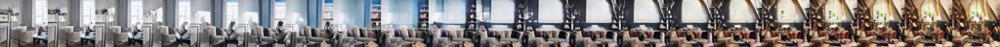

[0.17269770801067352, 0.11539839953184128, 0.47141003608703613, 0.8032132983207703, 0.3308751881122589, 0.546762228012085, 0.35232409834861755, 0.6882957816123962, 0.38650333881378174, 0.11241231113672256, 0.19781768321990967, 0.014873881824314594, 0.10206235945224762, 0.1516735851764679, 0.39726686477661133, 0.4145530164241791, 0.22534002363681793, 0.031773895025253296, 0.061389852315187454, 0.06270306557416916, 0.16420865058898926]


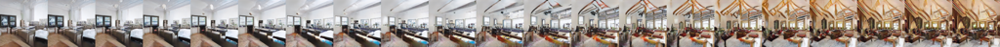

[0.31124117970466614, 0.15314774215221405, 0.04426749423146248, 0.014343688264489174, 0.0234408937394619, 0.10087066143751144, 0.025119034573435783, 0.03406175225973129, 0.04830852895975113, 0.2241910994052887, 0.04482756182551384, 0.015643367543816566, 0.007764848414808512, 0.003998293541371822, 0.017429808154702187, 0.02078821510076523, 0.007780779153108597, 0.017411326989531517, 0.01949569396674633, 0.016303136944770813, 0.016925733536481857]


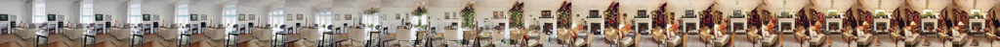

[0.08230161666870117, 0.02743210457265377, 0.021512994542717934, 0.014291119761765003, 0.0127111179754138, 0.0033287368714809418, 0.0024675519671291113, 0.0012887610355392098, 0.0020471748430281878, 0.0014930476900190115, 0.002874677302315831, 0.0019564656540751457, 0.0054797944612801075, 0.0022404470946639776, 0.003701290348544717, 0.0019497101893648505, 0.0006195008754730225, 0.0039893630892038345, 0.001491958973929286, 0.001706545241177082, 0.0042466274462640285]


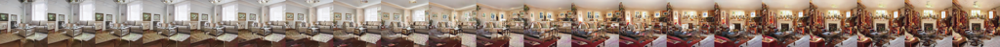

[0.09285666048526764, 0.0694856122136116, 0.0870589166879654, 0.036901965737342834, 0.07122745364904404, 0.03278731927275658, 0.057665713131427765, 0.043457284569740295, 0.3008899986743927, 0.1513131707906723, 0.05526960641145706, 0.009495090693235397, 0.00971218105405569, 0.0035386912059038877, 0.005818767473101616, 0.004622376058250666, 0.001958739012479782, 0.002601801650598645, 0.00717101339250803, 0.03400048613548279, 0.06414598971605301]


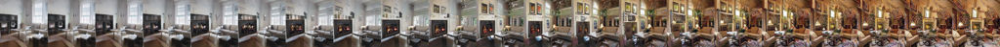

[0.046790674328804016, 0.036100663244724274, 0.07912452518939972, 0.27920928597450256, 0.2623565196990967, 0.22291019558906555, 0.03670082986354828, 0.018309442326426506, 0.008149401284754276, 0.05595115199685097, 0.09174351394176483, 0.22994664311408997, 0.10052694380283356, 0.017753595486283302, 0.014559408649802208, 0.0026337322778999805, 0.0007007802487351, 0.0009235193720087409, 0.002240860601887107, 0.002716436982154846, 0.0036097157280892134]


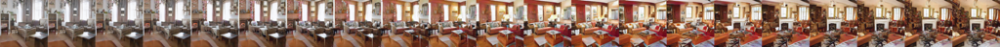

In [551]:
show_gan_results(gan_results)

## Hooking a model with InstrumentedModel

To analyze what a model is doing inside, we can wrap it with an InstrumentedModel, which makes it easy to hook or modify a particular layer.

InstrumentedModel adds a few useful functions for inspecting a model, including:
   * `model.retain_layer('layername')` - hooks a layer to hold on to its output after computation
   * `model.retained_layer('layername')` - returns the retained data from the last computation
   * `model.edit_layer('layername', rule=...)` - runs the `rule` function after the given layer
   * `model.remove_edits()` - removes editing rules

Let's setup `retain_layer` now.  We'll pick a layer sort of in the early-middle of the generator.  You can pick whatever you like.

In [14]:
transformation = transformations.OneDirection(latent_space_dim)
transformation.load_state_dict(
    torch.load(
#         "/home/ubuntu/GANSteering/proggan/pytorch_model_progran_steering_a floral bedroom_final.pth",
        "/home/ubuntu/GANSteering/proggan/pytorch_model_progran_steering_a floral bedroom_final.pth",
#        "./checkpoints/results_maximize_a santorini room_probability/pytorch_model_progran_0.pth",
    ),
    strict=True,
)
transformation.to(device)
transformation.eval()


approach:  one_direction



OneDirection(
  (criterion): MSELoss()
)

In [553]:
!ls ./checkpoints

'pytorch_model_progran_steering_a floral bedroom_final.pth'
'pytorch_model_progran_steering_a luxurious bedroom_final.pth'
'results_maximize_a baroque room_probability'
'results_maximize_a flinstone room_probability'
'results_maximize_a luxurious bedroom_probability'
'results_maximize_a santorini room_probability'
'results_maximize_a scientific bedroom_probability'
'results_maximize_a scientific room_probability'
 results_maximize_classifier_probability


In [15]:
from netdissect import nethook
from netdissect import imgviz
from netdissect import show
from netdissect import tally
from netdissect import upsample
from netdissect import segviz

# Don't re-wrap it, if it's already wrapped (e.g., if you press enter twice)
if not isinstance(proggan_model, nethook.InstrumentedModel):
    proggan_model = nethook.InstrumentedModel(proggan_model)
proggan_model.retain_layer('layer4')

In [16]:
# Run the model
img = proggan_model(zds[0][0][None,...].to(device))

# As a side-effect, the proggan_model has retained the output of layer4.
acts = proggan_model.retained_layer('layer4')

# We can look at it.  How much data is it?
acts.shape

torch.Size([1, 512, 8, 8])

In [17]:
# Let's just look at the 0th convolutional channel.
print(acts[0,0])

tensor([[ 0.0606, -0.7030, -1.0509, -0.8829, -0.6333, -0.1988, -0.2149, -0.2831],
        [ 0.0873, -0.8437, -1.3125, -1.1911, -0.7304, -0.6186, -1.1536, -1.2268],
        [ 1.2783, -0.4581, -1.2679, -1.2668, -0.5798, -0.3364, -0.9477, -1.0827],
        [ 0.6238, -0.5971, -1.1597, -0.7756,  0.7416,  2.3029, -0.1885, -0.6707],
        [ 1.8114,  0.0768, -0.1365,  1.8669,  4.3874,  3.9897,  1.7991, -0.1978],
        [ 1.4106,  0.1386, -0.4035, -0.1991,  0.3048,  0.7678,  1.1622,  0.0919],
        [ 0.5110, -0.4878, -0.8038, -0.4792,  0.3009,  2.1359,  2.2845,  1.2680],
        [-0.2782, -0.7478, -0.9427, -0.4848,  2.7965,  2.4834, -0.0867, -0.3202]],
       device='cuda:0')


## Visualizing activation data

It can be informative to visualize activation data instead of just looking at the numbers.

Net dissection comes with an ImageVisualizer object for visualizing grid data as an image in a few different ways.  Here is a heatmap of the array above:

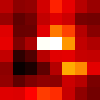

In [18]:
iv = imgviz.ImageVisualizer(100)
iv.heatmap(acts[0,1], mode='nearest')


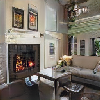
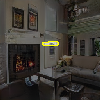
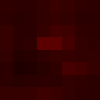
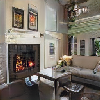
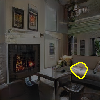
...
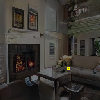
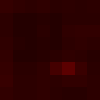
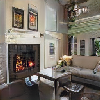
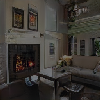
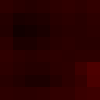

In [19]:

show(
    [['unit %d' % u,
      [iv.image(img[0])],
      [iv.masked_image(img[0], acts, (0,u))],
      [iv.heatmap(acts, (0,u), mode='nearest')],
     ] for u in range(1, 6)]  
)

## Collecting quantile statistics for every unit

We want to know per-channel minimum or maximum values, means, medians, quantiles, etc.

We want to treat each pixel as its own sample for all the channels.  For example, here are the activations for one image as an 8x8 tensor over with 512 channels.  We can disregard the geometry and just look at it as a 64x512 sample matrix, that is 64 samples of 512-dimensional vectors.

In [20]:
print(acts.shape)
print(acts.permute(0, 2, 3, 1).contiguous().view(-1, acts.shape[1]).shape)

torch.Size([1, 512, 8, 8])
torch.Size([64, 512])


Net dissection has a tally package that tracks quantiles over large samples.

To use it, just define a function that returns sample matrices like the 64x512 above, and then it will call your function on every batch and tally up the statistics.

In [32]:
# To collect stats, define a function that returns 2d [samples, units]
def compute_samples(zbatch):
    _ = proggan_model(zbatch.to(device))          # run the proggan_model
    acts = proggan_model.retained_layer('layer4') # get the activations, and flatten
    return acts.permute(0, 2, 3, 1).contiguous().view(-1, acts.shape[1])

# Then tally_quantile will run your function over the whole dataset to collect quantile stats
rq = tally.tally_quantile(compute_samples, zds)

# Print out the median value for the first 20 channels
rq.quantiles(0.5)[:20]

  0%|          | 0/2 [00:00<?, ?it/s]

tensor([-0.5765, -0.3409, -0.5731, -0.2812, -0.5170, -0.7658, -0.4295, -0.3253,
        -0.8930, -0.9710, -0.7503, -0.6170, -0.5622, -0.4894, -0.4490, -0.7498,
        -0.4709, -0.6626, -0.4214, -0.8166])

## Exploring quantiles

The rq object tracks a sketch of all the quantiles of the sampled data.  For example, what is the mean, median, and percentile value for each unit?

In [453]:
# This tells me now, for example, what the means are for channel,
# rq.mean()
# what median is,
# rq.quantiles(0.5)
# Or what the 99th percentile quantile is.
# rq.quantiles(0.99)

(rq.quantiles(0.8) > 0).sum()

tensor(288)

The quantiles can be plugged directly into the ImageVisualizer to put heatmaps on an informative per-unit scale.  When you do this:

   * Heatmaps are shown on a scale from black to white from 1% lowest to the 99% highest value.
   * Masked image lassos are shown at a 95% percentile level (by default, can be changed).


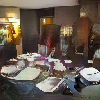
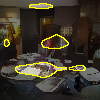
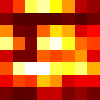
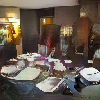
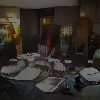
...
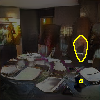
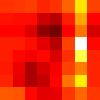
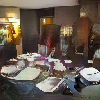
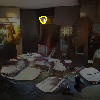
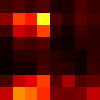

In [454]:
iv = imgviz.ImageVisualizer(100, quantiles=rq)
show([
    [  # for every unit, make a block containing
       'unit %d' % u,         # the unit number
       [iv.image(img[0])],    # the unmodified image
       [iv.masked_image(img[0], acts, (0,u))], # the masked image
       [iv.heatmap(acts, (0,u), mode='nearest')], # the heatmap
    ]
    for u in range(414, 420)
])

In [455]:
def compute_image_max(zbatch):
    image_batch = proggan_model(zbatch.to(device))
    return proggan_model.retained_layer('layer4').max(3)[0].max(2)[0]

topk = tally.tally_topk(compute_image_max, zds)
topk.result()[1].shape

  0%|          | 0/1 [00:00<?, ?it/s]

torch.Size([512, 6])


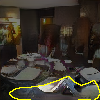
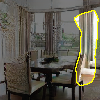
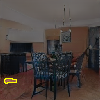
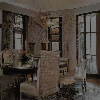
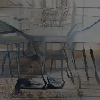
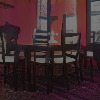

In [456]:
# For each unit, this function prints out unit masks from the top-activating images
def unit_viz_row(unitnum, percent_level=0.95):
    out = []
    for imgnum in topk.result()[1][unitnum][:8]:
        img = proggan_model(zds[imgnum][0][None,...].to(device))
        acts = proggan_model.retained_layer('layer4')
        out.append([imgnum.item(),
                    [iv.masked_image(img[0], acts, (0, unitnum), percent_level=percent_level)],
                   ])
    return out

show(unit_viz_row(30))

# Evaluate matches with semantic concepts

Do the filters match any semantic concepts?  To systematically examine this question,
we have pretrained (using lots of labeled data) a semantic segmentation network to recognize
a few hundred classes of objects, parts, and textures.

Run the code in this section to look for matches between filters in our GAN and semantic
segmentation clases.

## Labeling semantics within the generated images

Let's quantify what's inside these images by segmenting them.

First, we create a segmenter network.  (We use the Unified Perceptual Parsing segmenter by Xiao, et al. (https://arxiv.org/abs/1807.10221).

Note that the segmenter we use here requires a GPU.

In [22]:
from netdissect import segmenter, setting

# segmodel = segmenter.UnifiedParsingSegmenter(segsizes=[256])
segmodel, seglabels, _ = setting.load_segmenter('netpq')
# seglabels = [l for l, c in segmodel.get_label_and_category_names()[0]]
print('segmenter has', len(seglabels), 'labels')

segmenter has 1813 labels


Then we create segmentation images for the dataset.  Here tally_cat just concatenates batches of image (or segmentation) data.

  * `segmodel.segment_batch` segments an image
  * `iv.segmentation(seg)` creates a solid-color visualization of a segmentation
  * `iv.segment_key(seg, segmodel)` makes a small legend for the segmentation

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

,
,wall
,table
,floor
,plate
,ceiling
,
,wall
,chair
,floor
,door

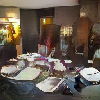
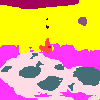
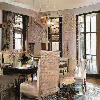
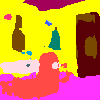
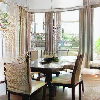
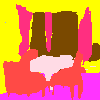
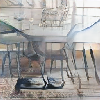
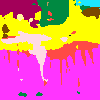
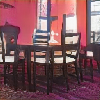
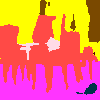

In [458]:
imgs = tally.tally_cat(lambda zbatch: proggan_model(zbatch.to(device)), zds)
seg = tally.tally_cat(lambda img: segmodel.segment_batch(img.cuda(), downsample=1), imgs)

from netdissect.segviz import seg_as_image, segment_key
show([
    (iv.image(imgs[i]),
     iv.segmentation(seg[i,0]),
     iv.segment_key(seg[i,0], segmodel)
    )
    for i in range(min(len(seg), 5))
])

In [459]:
torch.cuda.empty_cache()
!nvidia-smi

Tue May  9 06:19:25 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   42C    P0    35W /  70W |  11552MiB / 15360MiB |     33%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [460]:
# We upsample activations to measure them at each segmentation location.
upfn8 = upsample.upsampler((64, 64), (8, 8)) # layer4 is resolution 8x8

def compute_conditional_samples(zbatch):
    image_batch = proggan_model(zbatch.to(device))
    seg = segmodel.segment_batch(image_batch, downsample=4)
    upsampled_acts = upfn8(proggan_model.retained_layer('layer4'))
    return tally.conditional_samples(upsampled_acts, seg)

# Run this function once to sample one image
sample = compute_conditional_samples(zds[0][0].cuda()[None,...])

# The result is a list of all the conditional subsamples
[(seglabels[c], d.shape) for c, d in sample]

[('-', torch.Size([4096, 512])),
 ('wall', torch.Size([1691, 512])),
 ('floor', torch.Size([711, 512])),
 ('ceiling', torch.Size([216, 512])),
 ('table', torch.Size([966, 512])),
 ('chair', torch.Size([42, 512])),
 ('door', torch.Size([8, 512])),
 ('armchair', torch.Size([5, 512])),
 ('plate', torch.Size([424, 512])),
 ('column', torch.Size([33, 512])),
 ('wall-t', torch.Size([840, 512])),
 ('floor-t', torch.Size([310, 512])),
 ('ceiling-t', torch.Size([151, 512])),
 ('table-t', torch.Size([381, 512])),
 ('chair-t', torch.Size([13, 512])),
 ('door-t', torch.Size([3, 512])),
 ('armchair-t', torch.Size([2, 512])),
 ('plate-t', torch.Size([224, 512])),
 ('column-t', torch.Size([12, 512])),
 ('wall-l', torch.Size([817, 512])),
 ('floor-l', torch.Size([366, 512])),
 ('ceiling-l', torch.Size([117, 512])),
 ('table-l', torch.Size([587, 512])),
 ('chair-l', torch.Size([13, 512])),
 ('door-l', torch.Size([3, 512])),
 ('armchair-l', torch.Size([2, 512])),
 ('plate-l', torch.Size([184, 512])),
 (

In [461]:
cq = tally.tally_conditional_quantile(compute_conditional_samples, zds)

  0%|          | 0/6 [00:00<?, ?it/s]

Conditional quantile statistics let us compute lots of relationships between units and visual concepts.

For example, IoU is the "intersection over union" ratio, measuring how much overlap there is between the top few percent activations of a unit and the presence of a visual concept.  We can estimate the IoU ratio for all pairs between units and concepts with these stats:

In [462]:
iou_table = tally.iou_from_conditional_quantile(cq, cutoff=0.99)
iou_table.shape

torch.Size([512, 1798])

Now let's view a few of the units, labeled with an associated concept, sorted from highest to lowest IoU.

unit 123: pane (iou 0.35)



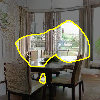
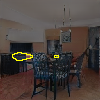
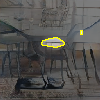
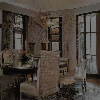
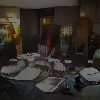
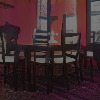

unit 10: door-t (iou 0.35)



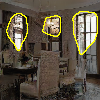
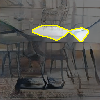
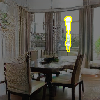
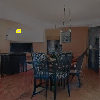
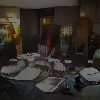
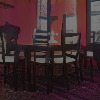

unit 465: pane (iou 0.33)



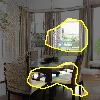
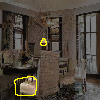
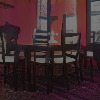
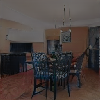
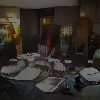
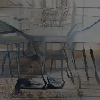

unit 353: pane (iou 0.31)



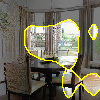
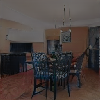
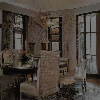
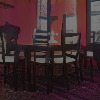
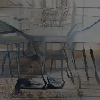
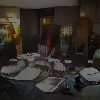

unit 306: pane (iou 0.31)



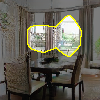
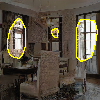
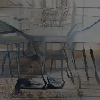
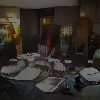
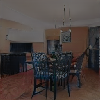
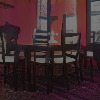

In [463]:
unit_list = sorted(enumerate(zip(*iou_table.max(1))), key=lambda k: -k[1][0])

for unit, (iou, segc) in unit_list[:5]:
    print('unit %d: %s (iou %.2f)' % (unit, seglabels[segc], iou))
    show(unit_viz_row(unit))

We can quantify the overall match between units and segmentation concepts by counting the number of units that match a segmentation concept (omitting low-scoring matches).

In [418]:
print('Number of units total:', len(unit_list))
print('Number of units that match a segmentation concept with IoU > 0.04:',
   len([i for i in range(len(unit_list)) if unit_list[i][1][0] > 0.04]))

Number of units total: 512
Number of units that match a segmentation concept with IoU > 0.04: 486


## Examining units that select for lamp

Now let's filter just units that were labeled as 'lamp' units.

In [419]:
lamp_index = seglabels.index('lamp')
lamp_units = [(unit, iou) for iou, unit in
              list(zip(*(iou_table[:,lamp_index].sort(descending=True))))[:10]]

In [420]:
lamp_units

[(tensor(122), tensor(0.0908)),
 (tensor(80), tensor(0.0825)),
 (tensor(409), tensor(0.0797)),
 (tensor(116), tensor(0.0602)),
 (tensor(184), tensor(0.0551)),
 (tensor(4), tensor(0.0447)),
 (tensor(24), tensor(0.0388)),
 (tensor(390), tensor(0.0363)),
 (tensor(309), tensor(0.0315)),
 (tensor(400), tensor(0.0314))]

unit 122, iou 0.09



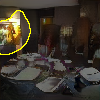
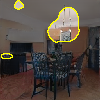
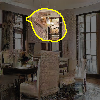
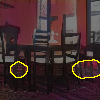
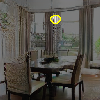
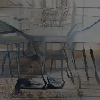

unit 80, iou 0.08



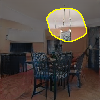
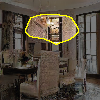
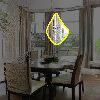
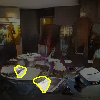
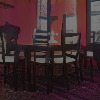
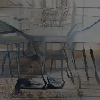

unit 409, iou 0.08



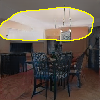
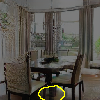
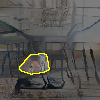
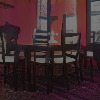
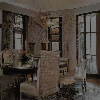
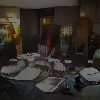

unit 116, iou 0.06



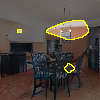
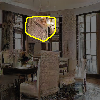
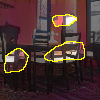
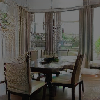
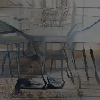
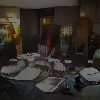

unit 184, iou 0.06



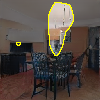
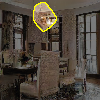
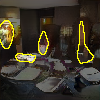
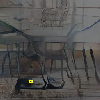
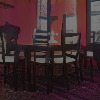
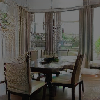

unit 4, iou 0.04



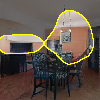
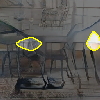
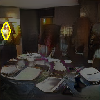
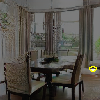
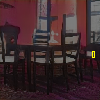
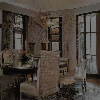

unit 24, iou 0.04



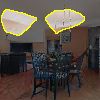
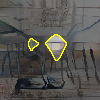
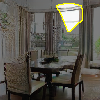
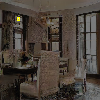
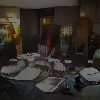
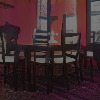

unit 390, iou 0.04



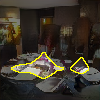
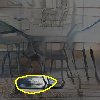
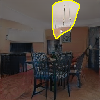
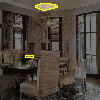
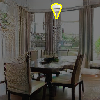
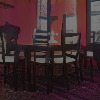

unit 309, iou 0.03



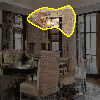
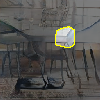
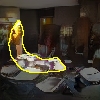
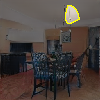
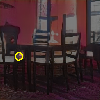
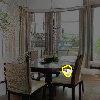

unit 400, iou 0.03



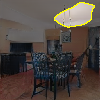
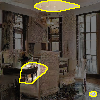
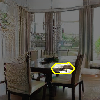
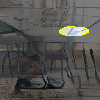
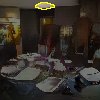
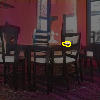

In [421]:
# tree_units = [(unit, iou, segc) for unit, (iou, segc) in unit_list if seglabels[segc] == 'tree'][:10]
# If you can't run the segmenter, uncomment the line below and comment the one above.
# tree_units = [365, 157, 119, 374, 336, 195, 278, 76, 408, 125]

for unit, iou in lamp_units:
    print('unit %d, iou %.2f' % (unit, iou))
    show(unit_viz_row(unit))

## Editing a model by altering units

Now let's try changing some units directly to see what they do.

We we will use `model.edit_layer` to do that.

This works by just allowing you to define a function that edits the output of a layer.

We will edit the output of `layer4` by zeroing ten of the tree units.

In [422]:
# Leo: Changed here how the tree units are used as indexes
lamp_units_ix = [ix for ix, _ in lamp_units]
lamp_units_ix

[tensor(122),
 tensor(80),
 tensor(409),
 tensor(116),
 tensor(184),
 tensor(4),
 tensor(24),
 tensor(390),
 tensor(309),
 tensor(400)]

  0%|          | 0/1 [00:00<?, ?it/s]

Before,After
Before,After
Before,After
Before,After
Before,After
Before,After

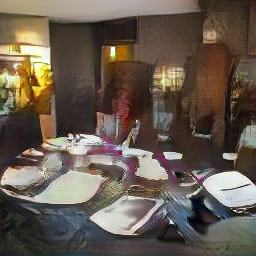
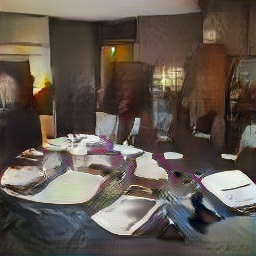
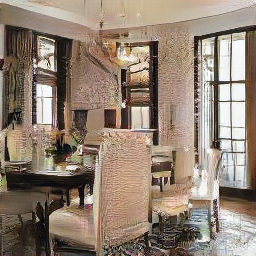
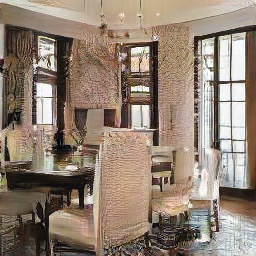
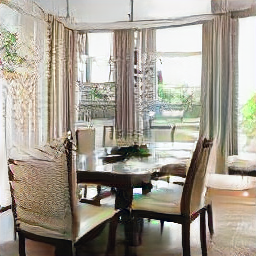
...
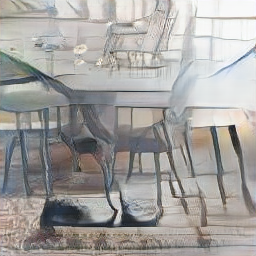
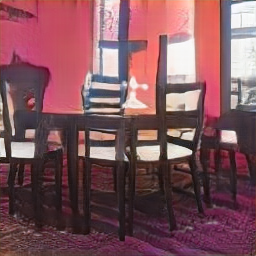
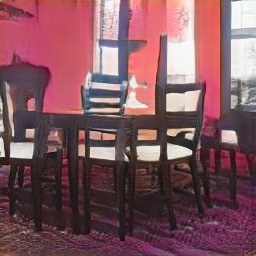
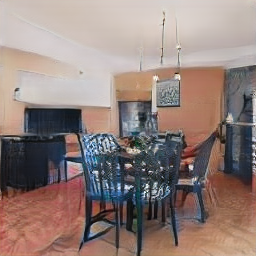
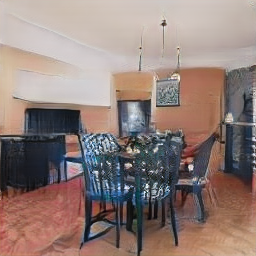

In [423]:
def zero_out_lamp_units(data, model):
    data[:, lamp_units_ix, :, :] = 0.0
    return data

proggan_model.edit_layer('layer4', rule=zero_out_lamp_units)
edited_imgs = tally.tally_cat(lambda zbatch: proggan_model(zbatch.to(device)), zds)
show([
    (['Before', [renormalize.as_image(imgs[i])]],
     ['After', [renormalize.as_image(edited_imgs[i])]])
      for i in range(min(10, len(zds)))])
proggan_model.remove_edits()

# Testing causal effects of representation units

Now it's your turn.

Now try the following experiments:
   * Instead of zeroing the lamp units, try setting them negative, e.g., to -5.
   * Instead of turning the lamp units off, try turning them on, e.g., set them to 10.


  0%|          | 0/1 [00:00<?, ?it/s]

Before,After
Before,After
Before,After
Before,After
Before,After
Before,After

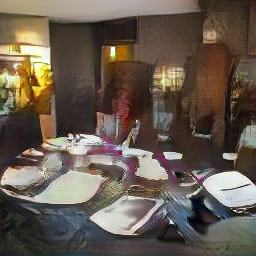
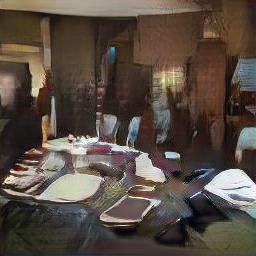
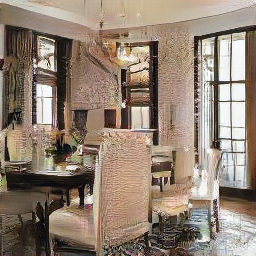
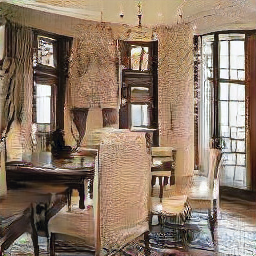
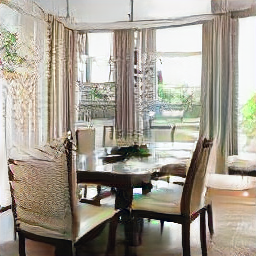
...
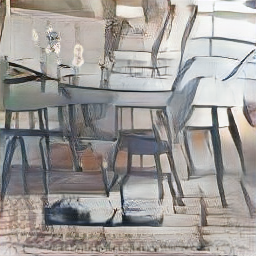
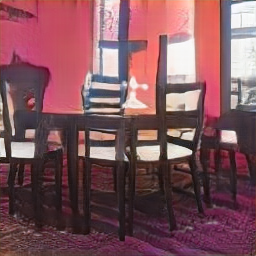
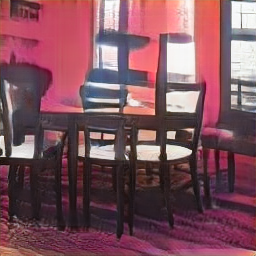
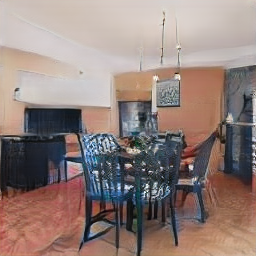
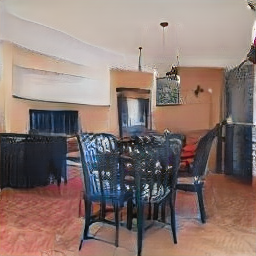

In [424]:
def zero_out_lamp_units(data, proggan_model):
    data[:, lamp_units_ix, :, :] = -5
    return data

proggan_model.edit_layer('layer4', rule=zero_out_lamp_units)
edited_imgs = tally.tally_cat(lambda zbatch: proggan_model(zbatch.to(device)), zds)

show([
    (['Before', [renormalize.as_image(imgs[i])]],
     ['After', [renormalize.as_image(edited_imgs[i])]])
      for i in range(min(10, len(zds)))])

proggan_model.remove_edits()

# Examining units for other concepts


Find a set of `blanket`-selective units `blanket_units` (instead of `lamp_units`), or choose another concept.

Then create a set of examples show the effect of setting the these off, to `-5.0` or on, at `10.0`.

What is the effect on blankets?  What is the effect on other types of objects in the generated scenes?

  0%|          | 0/1 [00:00<?, ?it/s]

Before,After
Before,After
Before,After
Before,After
Before,After
Before,After

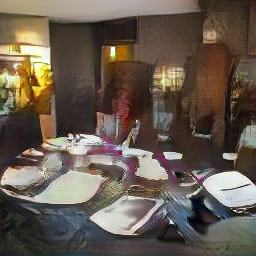
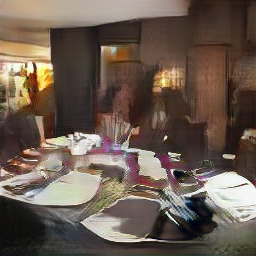
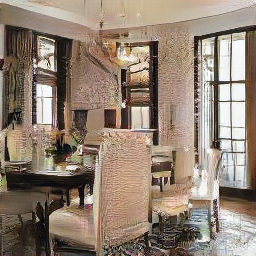
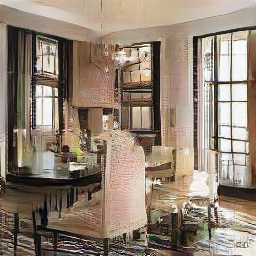
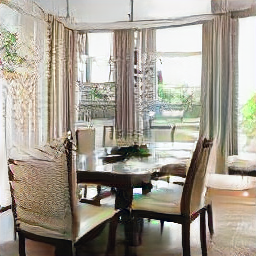
...
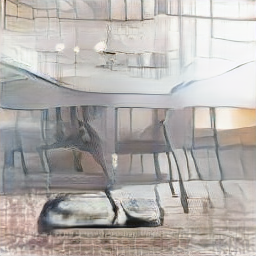
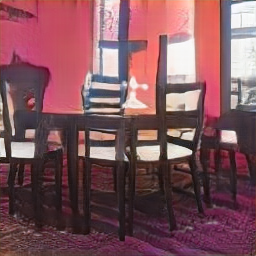
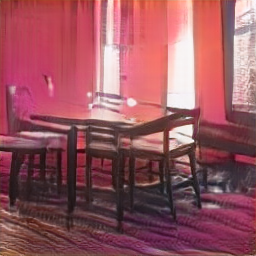
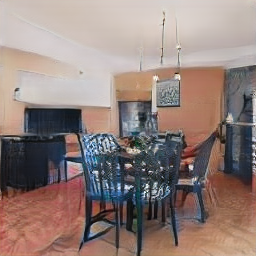
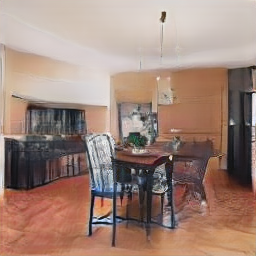

In [425]:
# Your solution to exercise 4.

blanket_index = seglabels.index('chair')
blanket_units = [(unit, iou) for iou, unit in
              list(zip(*(iou_table[:,blanket_index].sort(descending=True))))[:10]]
blanket_units_ix = [ix for ix, _ in blanket_units]

def turn_off_blanket_units(data, model):
    data[:, blanket_units_ix, :, :] = -5.0
    return data

# Then visualize the effect
proggan_model.edit_layer('layer4', rule=turn_off_blanket_units)
edited_imgs = tally.tally_cat(lambda zbatch: proggan_model(zbatch.to(device)), zds)

show([
    (['Before', [renormalize.as_image(imgs[i])]],
     ['After', [renormalize.as_image(edited_imgs[i])]])
      for i in range(min(10, len(zds)))])
proggan_model.remove_edits()

# Steered ProGAN

We will take the steering model, and compare what happens with the proggan with the original and the steered noise. 

First, we take 5 original noises and steer them

In [23]:
alpha = 0.2
iters = 5
batch_size = 5

# Generate images by transforming the z vector in the positive direction
zds_dataloader = DataLoader(zds, batch_size=batch_size, shuffle=False)


with torch.no_grad():
    step_sizes = (
        (torch.ones((batch_size, latent_space_dim)) * alpha).float().to(device)
    )

    for zbatch in zds_dataloader:
        original_noise = zbatch[0].squeeze().to(device)
        transformed_noise = original_noise.clone()

        for iter in range(iters):
            transformed_noise = transformation.transform(transformed_noise, None, step_sizes)
            
        break


In [24]:
transformed_noise = transformed_noise[..., None, None]
original_noise = original_noise[..., None, None]

transformed_noise.shape, original_noise.shape

(torch.Size([5, 512, 1, 1]), torch.Size([5, 512, 1, 1]))

## Compare the GAN dissect with ProGAN and steered ProGAN

Now we've got the transformed noise, which we can use it to create images with the ProGAN.

First, let's compare the **highest activations** in the fourth layer using the transformed noise to the ones using 
the original noise vector.

In [25]:
def find_all_activated_units(acts, threshold = 0,image_num = None):
    n_images = acts.shape[0]
    n_units = acts.shape[1]
    unit_activation_shape = acts.shape[2]*acts.shape[3]
    if image_num > -1:
        activation = acts[image_num]
    else:
        print("Averaging all images")
        reshaped_tensor = acts.view(n_images*n_units, acts.shape[2], acts.shape[3])
        activation = torch.mean(reshaped_tensor, dim=0)
    flattened_activation = activation.view(n_units, unit_activation_shape)
    
    # Find the indices of units with activation greater than the threshold
    unit_indices = torch.nonzero(torch.any(flattened_activation > threshold, dim=1), as_tuple=False)[:, 0]

    average_activations_filtered = torch.mean(flattened_activation[unit_indices], dim=1)

#     row_numbers = torch.nonzero(torch.any(flattened_activation > threshold, dim=1), as_tuple=False)[:, 0]
    sorted_unit_indices = torch.argsort(average_activations_filtered, descending=True)

    return sorted_unit_indices

In [26]:
transformed_img = proggan_model(transformed_noise)
transformed_acts = proggan_model.retained_layer('layer4')

In [27]:
transformed_activated_units = find_all_activated_units(transformed_acts, threshold = 0,image_num = 0)
transformed_activated_units

tensor([412, 353,  40, 233, 345, 349, 165, 458, 125, 117, 453,  29, 437, 161,
        243, 298, 240, 276,  50,  82,  42,  79, 150, 156, 183, 132, 163, 151,
        222, 376, 215, 438,  18, 244, 348, 420, 221, 155,  67,   7,  60, 451,
        411, 170, 410, 297, 126, 166, 217,  93, 162, 377, 373, 395,  81, 403,
        226, 278, 417, 325, 331, 311, 245,  31, 421, 152,   0, 322, 370, 235,
        319, 275, 452, 429, 102, 206, 134, 101, 300, 360, 147,  78, 203, 447,
         21, 158, 308, 271, 179,  84, 268, 154, 399, 441,  16,  80, 313, 139,
        182, 189, 350, 262, 362, 103, 108,  63, 238, 339, 116, 265, 335, 270,
        202, 228, 434,  89,  27, 123, 338, 223, 232, 462, 167, 149, 191, 136,
         83,  72, 433, 258, 181, 317,  55, 279,  34, 359,  91, 192, 343, 168,
        472, 261, 251,  99, 113, 118, 444, 267, 100, 337, 440, 460, 430, 272,
        309, 293, 455, 375,  30, 347, 361, 144, 387, 363, 443,  22, 302, 253,
        234, 252, 465,   6, 310, 204, 185, 290, 303,  68, 127,  

  0%|          | 0/1 [00:00<?, ?it/s]


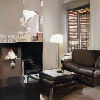
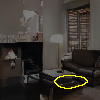
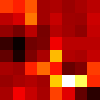
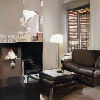
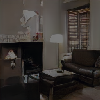
...
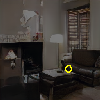
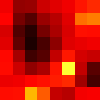
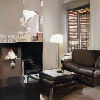
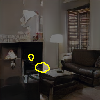
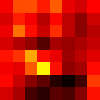

In [28]:
rq_transformed = tally.tally_quantile(compute_samples, transformed_noise)
iv = imgviz.ImageVisualizer(100, quantiles=rq_transformed)

show([
    [  # for every unit, make a block containing
       'unit %d' % u,         # the unit number
       [iv.image(transformed_img[0])],    # the unmodified image
       [iv.masked_image(transformed_img[0], transformed_acts, (0,u))], # the masked image
       [iv.heatmap(transformed_acts, (0,u), mode='nearest')], # the heatmap
    ]
    for u in transformed_activated_units[:5]
])

In [29]:
def find_semantic_concepts(activated_units, iou_table):
    semantic_concept = []
    semantic_conecpt_iou = []
    for u in activated_units:
        semantic_concept_index = torch.argmax(iou_table[u])
        iou = iou_table[u,semantic_concept_index ]
        semantic_concept.append(seglabels[semantic_concept_index])
        semantic_conecpt_iou.append(iou)
    return semantic_concept,semantic_conecpt_iou

Create a dataframe with the information of each activated unit, for image 0. In case you want to do the average of images, instead of having only one, use image_num = None

In [33]:
import pandas as pd

def create_image_dataframe(noise, threshold = 0, image_num = None):
    img = proggan_model(noise)
    acts = proggan_model.retained_layer('layer4')
    activated_units = find_all_activated_units(acts, threshold = threshold,image_num = image_num)
    cq = tally.tally_conditional_quantile(compute_conditional_samples, noise)
    iou_table = tally.iou_from_conditional_quantile(cq, cutoff=0.99) 
    associated_concepts, iou = find_semantic_concepts(activated_units, iou_table)
    data = {
        'Semantic Concept': associated_concepts,
        'IoU':  [float(tensor.item()) for tensor in iou]
    }

    df = pd.DataFrame(data, index=activated_units.tolist())
    df.index.name = 'Activated Units'
    return df

In [34]:
df_transformed = create_image_dataframe(transformed_noise, 0,0)
df_transformed

NameError: name 'compute_conditional_samples' is not defined

Let's do the same with the original noise

In [483]:
original_img = proggan_model(original_noise)
original_acts = proggan_model.retained_layer('layer4')

In [484]:
original_activated_units = find_all_activated_units(original_acts, threshold = 0,image_num = 0)
original_activated_units

tensor([215,  74, 221, 382,  95, 430, 317, 231, 422, 462,  27, 376, 108,  52,
         15, 293, 410, 133,  22, 186, 362,  71,  62,  58,  65, 465, 413,  84,
        463, 401, 104, 368, 316,  21,  59, 442, 310, 461, 155,  41, 399, 173,
        418, 247, 269, 458,  29, 349, 355,  30, 459, 246,  31, 114, 354, 209,
        405, 159, 337, 102,  72, 457, 344, 306, 291, 253, 128,  55, 170,  38,
        400, 335, 280, 295, 348, 431, 275,  75, 154, 220, 118, 409,  68, 387,
        149, 213, 345, 330, 282,  82,  47, 351, 300, 297, 226, 193, 403, 342,
         89, 203, 424, 398, 286, 404, 350, 437, 196, 164,  37, 388,  56, 453,
        372,  46, 421,  85, 338, 194, 391, 279, 111, 248,  45,  17,  91, 423,
         67, 156,  44, 146,  26,  49,  11, 105, 358, 426, 427, 201, 172, 258,
        180, 356, 222, 169, 353, 167, 119, 123, 134, 341, 373,  36, 433, 367,
        379, 217, 120, 381, 252, 250, 187, 171,  28,  70, 157, 188, 112, 331,
        301, 318, 264, 224, 411, 197, 153,  12,  99, 315, 148, 3


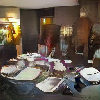
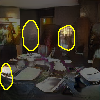
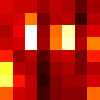
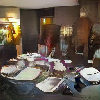
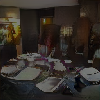
...
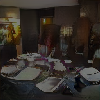
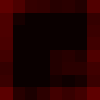
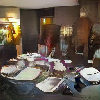
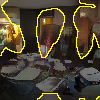
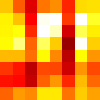

In [485]:
show([
    [  # for every unit, make a block containing
       'unit %d' % u,         # the unit number
       [iv.image(original_img[0])],    # the unmodified image
       [iv.masked_image(original_img[0], original_acts, (0,u))], # the masked image
       [iv.heatmap(original_acts, (0,u), mode='nearest')], # the heatmap
    ]
    for u in original_activated_units[:5]
])

In [486]:
df_original = create_image_dataframe(original_noise, 0,0)
df_original


  0%|          | 0/5 [00:00<?, ?it/s]

,Semantic Concept,IoU
Activated Units,,
215,back,0.086106
74,chair-r,0.083301
221,curtain-l,0.188486
382,window-t,0.186088
95,wall-r,0.052444
...,...,...
211,seat,0.092862
333,window-t,0.199780
366,leg,0.053319


Now, let's do some statistics to the transformed images using the steering model and then the original images

In [490]:
# Steered images
transformed_unit_counts = df_transformed['Semantic Concept'].value_counts()

transformed_average_iou = df_transformed.groupby('Semantic Concept')['IoU'].mean()

transformed_result = transformed_unit_counts.to_frame().join(transformed_average_iou)

transformed_result.columns = ['Unit Count', 'Average IoU']

transformed_result.head(10)


,Unit Count,Average IoU
Semantic Concept,,
seat,39,0.180581
wall-l,21,0.060197
tile,17,0.132706
top,16,0.135908
window-r,15,0.114844
plant,15,0.117194
sky-b,14,0.156036
ceramic,12,0.137105
chair-r,12,0.101427


In [491]:
# Original images
original_unit_counts = df_original['Semantic Concept'].value_counts()

original_average_iou = df_original.groupby('Semantic Concept')['IoU'].mean()

original_result = original_unit_counts.to_frame().join(original_average_iou)

original_result.columns = ['Unit Count', 'Average IoU']

original_result.head(10)

,Unit Count,Average IoU
Semantic Concept,,
seat,29,0.106479
ceramic,27,0.141768
chair-r,24,0.077575
leg,23,0.086407
back,22,0.082498
wallpaper,21,0.101399
window-t,21,0.140309
floor-t,16,0.062477
table-b,16,0.113148


In [492]:
import seaborn as sns
import matplotlib.pyplot as plt

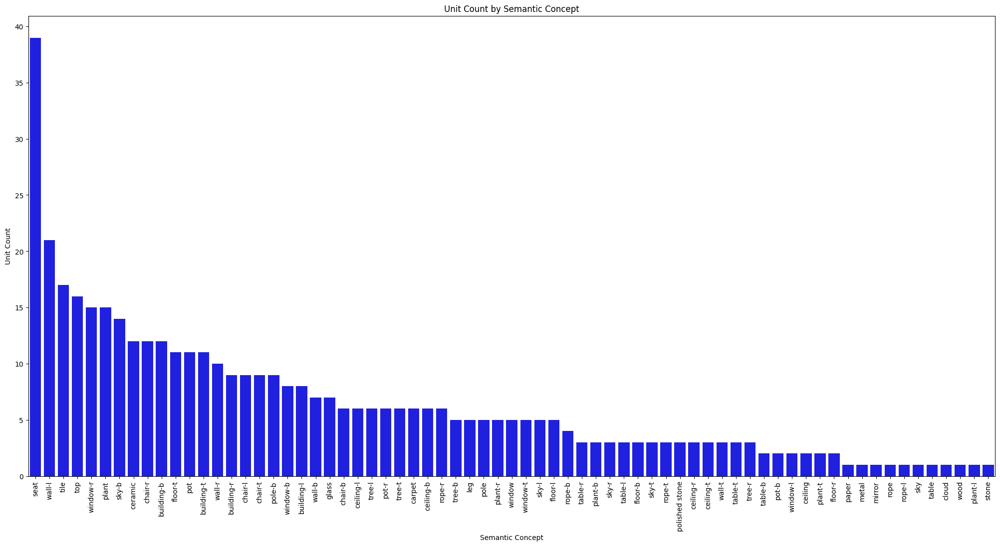

In [493]:
plt.figure(figsize=(25, 12))
sns.barplot(x=transformed_result.index, y='Unit Count', data=transformed_result, color='blue')
plt.xticks(rotation=90)
plt.xlabel('Semantic Concept')
plt.ylabel('Unit Count')
plt.title('Unit Count by Semantic Concept')
plt.show()

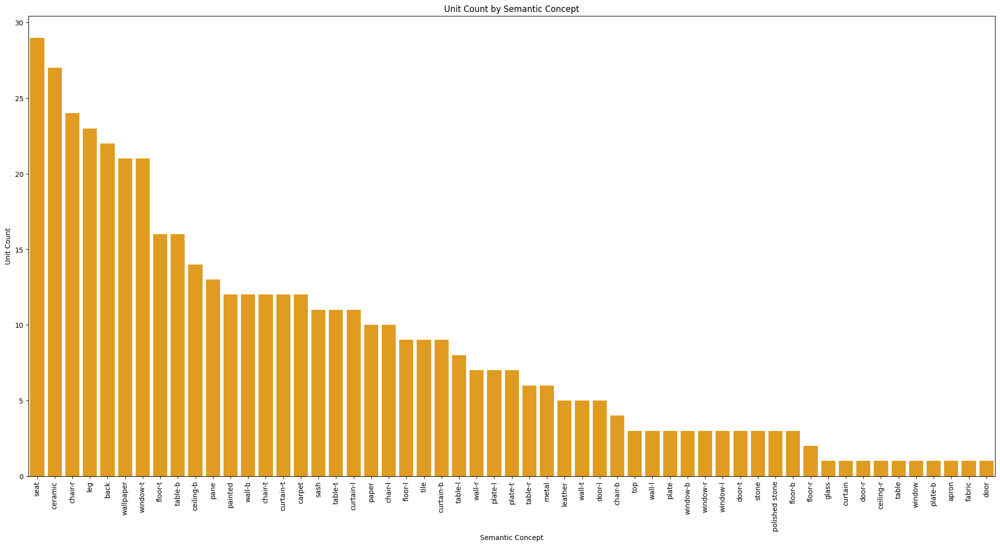

In [494]:
plt.figure(figsize=(25, 12))
sns.barplot(x=original_result.index, y='Unit Count', data=original_result, color='orange')
plt.xticks(rotation=90)
plt.xlabel('Semantic Concept')
plt.ylabel('Unit Count')
plt.title('Unit Count by Semantic Concept')
plt.show()

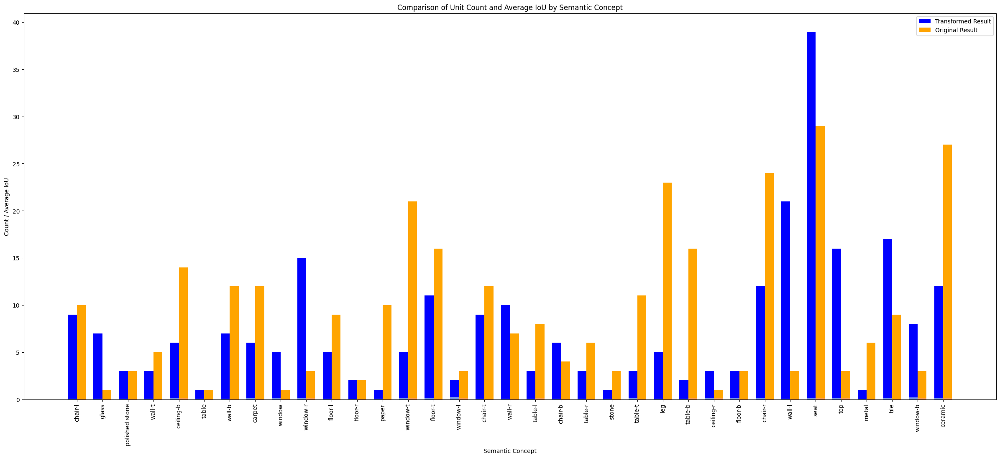

In [496]:
common_concepts = set(transformed_result.index).intersection(original_result.index)

# Reindex the DataFrames with the common concepts
transformed_result = transformed_result.reindex(common_concepts)
original_result = original_result.reindex(common_concepts)

# Set the width of each bar
bar_width = 0.35

# Set the position of each bar on the x-axis
r1 = np.arange(len(transformed_result.index))
r2 = [x + bar_width for x in r1]

# Set the figure size
plt.figure(figsize=(30, 12))

# Plot the transformed_result
plt.bar(r1, transformed_result['Unit Count'], color='blue', width=bar_width, label='Transformed Result')
plt.bar(r1, transformed_result['Average IoU'], color='lightblue', width=bar_width, alpha=0.7)

# Plot the original_result
plt.bar(r2, original_result['Unit Count'], color='orange', width=bar_width, label='Original Result')
plt.bar(r2, original_result['Average IoU'], color='lightsalmon', width=bar_width, alpha=0.7)

# Customize the x-axis ticks and labels
plt.xticks([r + bar_width/2 for r in range(len(transformed_result.index))], transformed_result.index, rotation=90)

# Set labels and title
plt.xlabel('Semantic Concept')
plt.ylabel('Count / Average IoU')
plt.title('Comparison of Unit Count and Average IoU by Semantic Concept')

# Add a legend
plt.legend()

# Show the plot
plt.show()
